Bringing over all code from Data Wrangling Notebook

In [70]:
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pandas_profiling
from scipy import stats
import numpy as np
import folium
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster


import warnings
warnings.filterwarnings('ignore')
import math
import time

In [71]:
#Input data
wells = pd.read_csv('InjectionWells.csv')
earthquakes = pd.read_csv('okQuakes.csv')

wells = wells[wells['LAT'].notna()]
wells = wells[wells['LONG'].notna()]

#Turn time column into datetime format, remove hour information to match up with the wells dataset, set time as the index
earthquakes['time'] = pd.to_datetime(earthquakes['time'])
earthquakes['Date'] = earthquakes['time'].dt.date
earthquakes = earthquakes.set_index('Date')
earthquakes.index = pd.to_datetime(earthquakes.index)

wells['Date'] = pd.to_datetime(wells['Approval Date'])
wells = wells.set_index('Date')
wells.sort_index()

wells['temp'] = '2016-09-20'
wells['temp'] = pd.to_datetime(wells['temp'])
wells['Days Active'] = wells['temp'] - wells.index
wells = wells.drop(['temp'], axis=1)

wells['PSI'] = wells['PSI'].replace(',','', regex=True)
wells['BBLS'] = wells['BBLS'].replace(',','', regex=True)
wells['BBLS'] = wells['BBLS'].replace('V-1600 CH 300', '300', regex=True)
wells['PSI'] = wells['PSI'].replace('V-2000 CH 1700', '1700', regex=True)

temp = wells.loc[wells['PSI'].isin(['224B/475G','226B/479G', '226B/479G','222B/470G', '235B/498G', '197B/416G',
       '225B/476G', '225B/475G', '223B/472G', '204B/432G', '223B/471G'  
    '228B/483G', '229B/484G', '229B/486G', '236B/499G', '230B/487G',
       '202B/428G', '226B/478G', '227B/481G', '218B/461G', '227B/480G','219B/464G','223B/471G', '228B/483G'])]

wells =  wells.loc[~wells['PSI'].isin(['224B/475G','226B/479G', '226B/479G','222B/470G', '235B/498G', '197B/416G',
       '225B/476G', '225B/475G', '223B/472G', '204B/432G', '223B/471G'  
    '228B/483G', '229B/484G', '229B/486G', '236B/499G', '230B/487G',
       '202B/428G', '226B/478G', '227B/481G', '218B/461G', '227B/480G','219B/464G','223B/471G', '228B/483G',])]

wells['PSI'] = wells['PSI'].astype(float)
temp['PSI1'] = '750'
temp = temp.drop(['PSI'], axis=1)
temp.rename(columns = {'PSI1':'PSI'}, inplace = True)
temp['PSI'] = temp['PSI'].astype(float)

wells = pd.concat([wells, temp])
wells['BBLS'] = wells['BBLS'].astype(float)

wells = wells.drop(['API#', 'Operator', 'Operator ID', 'WellType', 'WellName', 'WellNumber', 'OrderNumbers', 'Sec', 'Twp', 'Rng', 'QQQQ', 'Unnamed: 18', 'Unnamed: 19', 'Unnamed: 20'], axis=1)
wells = wells.drop(['Approval Date'], axis=1)

wells.rename(columns = {'LAT':'Latitude', 'LONG':'Longitude'}, inplace = True)
wells = wells.drop_duplicates()
wells['PSI'] = wells['PSI'].fillna(750.0)
wells['BBLS'] = wells['BBLS'].fillna(1100)

psi_high = wells['PSI'].mean() + 3 * wells['PSI'].std()
psi_low = wells['PSI'].mean() - 3 * wells['PSI'].std()
bbls_high = wells['BBLS'].mean() + 3 * wells['BBLS'].std()
bbls_low = wells['BBLS'].mean() - 3 * wells['BBLS'].std()

wells = wells[(wells['PSI'] < psi_high) & (wells['PSI'] > psi_low)]
wells = wells[(wells['BBLS'] < bbls_high) & (wells['BBLS'] > bbls_low)]

wells.rename(columns = {'BBLS':'Daily Volume'}, inplace = True)

earthquakes = earthquakes.drop(['nst', 'magType', 'dmin', 'net', 'updated', 'horizontalError', 'depthError', 'magError', 'magNst', 'status', 'locationSource', 'magSource'], axis=1)
earthquakes = earthquakes.drop(['gap'], axis=1)
earthquakes = earthquakes.drop(['time'], axis=1)
earthquakes = earthquakes.drop(['id', 'place'], axis=1)

earthquakes = earthquakes.loc[~earthquakes['type'].isin(['explosion', 'rock burst', 'mining explosion', 'mine collapse'])]
earthquakes.rename(columns = {'latitude':'Latitude', 'longitude':'Longitude', 'depth':'Depth', 'mag':'Magnitude', 'rms':'Velocity', 'type':'Type'}, inplace = True)

earthquakes['Magnitude'] = earthquakes['Magnitude'].fillna(2.6)
earthquakes['Velocity'] = earthquakes['Velocity'].fillna(0.4)

wells = wells[(wells['Longitude']>=-101.5)&(wells['Longitude']<=-93.5)&
                        (wells['Latitude']>=33.5)&(wells['Latitude']<=37.5)]

earthquakes = earthquakes[(earthquakes['Longitude']>=-101.5)&(earthquakes['Longitude']<=-93.5)&
                        (earthquakes['Latitude']>=33.5)&(earthquakes['Latitude']<=37.5)]
wells = wells.sort_index()
earthquakes = earthquakes.sort_index()

wells['Wells Frequency'] = 1
earthquakes['Earthquakes Frequency'] = 1

wells = wells.drop(['County'], axis=1)


In [72]:
map_earthquakes = folium.Map( location=[35.207878,-96.849979], zoom_start=7)

earthquakes.apply(lambda row:folium.Circle(location=[row["Latitude"], row['Longitude']],radius=5, color= 'red', fill_opacity=0.6).add_to(map_earthquakes), axis=1)
wells.apply(lambda row:folium.Circle(location=[row["Latitude"], row['Longitude']],radius=5, color= 'blue', fill_opacity=0.6).add_to(map_earthquakes), axis=1)

map_earthquakes

In [73]:
wells_day = wells.resample('D').mean()
wells_day['Wells Frequency'] = wells['Wells Frequency'].resample('D').sum()
wells_day['Daily Volume'] = wells['Daily Volume'].resample('D').sum()
wells_day = wells_day.dropna()
wells_day.head()

,Latitude,Longitude,PSI,Daily Volume,Wells Frequency
Date,,,,,
1936-12-18,34.199067,-97.399092,1100.0,3500.0,1
1945-04-22,36.901903,-95.900888,750.0,1100.0,1
1946-10-19,35.511472,-96.767417,0.0,100.0,1
1947-03-18,36.166273,-96.720024,750.0,2200.0,2
1947-03-28,36.718930,-95.546017,0.0,4600.0,1


In [74]:
wells_day['Days Since Last Well'] = wells_day.index.to_series().diff().dt.days
wells_day['Days Since Last Well'] = wells_day['Days Since Last Well'].fillna(0)
wells_day.head(10)

,Latitude,Longitude,PSI,Daily Volume,Wells Frequency,Days Since Last Well
Date,,,,,,
1936-12-18,34.199067,-97.399092,1100.0,3500.0,1,0.0
1945-04-22,36.901903,-95.900888,750.0,1100.0,1,3047.0
1946-10-19,35.511472,-96.767417,0.0,100.0,1,545.0
1947-03-18,36.166273,-96.720024,750.0,2200.0,2,150.0
1947-03-28,36.718930,-95.546017,0.0,4600.0,1,10.0
1947-11-20,34.453511,-97.759898,350.0,1790.0,1,237.0
1948-01-21,35.343148,-97.114245,400.0,5000.0,1,62.0
1949-06-08,34.423894,-98.034087,600.0,1550.0,2,504.0
1949-07-06,36.144316,-96.707733,750.0,2200.0,2,28.0


In [89]:

wells_day['Cumulative Daily Volume'] = wells_day['Daily Volume']
wells_day['Cumulative Daily Volume'] = wells_day['Cumulative Daily Volume'].cumsum().shift(1).fillna(0)
wells_day['Cumulative Total Volume'] = (wells_day['Cumulative Daily Volume'] * wells_day['Days Since Last Well']).cumsum()
wells_day.head(25)

,Latitude,Longitude,PSI,Daily Volume,Wells Frequency,Days Since Last Well,Cumulative Daily Volume,Cumulative Total Volume
Date,,,,,,,,
1936-12-18,34.199067,-97.399092,1100.0,3500.0,1,0.0,0.0,0.0
1945-04-22,36.901903,-95.900888,750.0,1100.0,1,3047.0,3500.0,10664500.0
1946-10-19,35.511472,-96.767417,0.0,100.0,1,545.0,4600.0,13171500.0
1947-03-18,36.166273,-96.720024,750.0,2200.0,2,150.0,4700.0,13876500.0
1947-03-28,36.718930,-95.546017,0.0,4600.0,1,10.0,6900.0,13945500.0
1947-11-20,34.453511,-97.759898,350.0,1790.0,1,237.0,11500.0,16671000.0
1948-01-21,35.343148,-97.114245,400.0,5000.0,1,62.0,13290.0,17494980.0
1949-06-08,34.423894,-98.034087,600.0,1550.0,2,504.0,18290.0,26713140.0
1949-07-06,36.144316,-96.707733,750.0,2200.0,2,28.0,19840.0,27268660.0


In [115]:
wells_resamp = wells_day.resample('W').mean()
earthquakes_resamp = earthquakes.resample('W').mean()
wells_resamp['Wells Frequency'] = wells_day['Wells Frequency'].resample('W').sum()
wells_resamp['Daily Volume'] = wells_day['Daily Volume'].resample('W').sum()
earthquakes_resamp['Earthquakes Frequency'] = earthquakes['Earthquakes Frequency'].resample('W').sum()

wells_resamp = wells_resamp.drop(['Latitude', 'Longitude', 'Days Since Last Well'], axis=1)
wells_resamp['Type'] = 'Injection Well'
earthquakes_resamp = earthquakes_resamp.drop(['Latitude', 'Longitude'], axis=1)
earthquakes_resamp['Type'] = 'Earthquake'

wells_resamp['Depth'] = 0
wells_resamp['Magnitude'] = 0
wells_resamp['Velocity'] = 0

earthquakes_resamp['PSI'] = 0
earthquakes_resamp['Daily Volume'] = 0
earthquakes_resamp['Days Since Last Well'] = 0
earthquakes_resamp['Cumulative Daily Volume'] = 0
earthquakes_resamp['Cumulative Total Volume'] = 0

wells_resamp = wells_resamp.dropna()
earthquakes_resamp = earthquakes_resamp.dropna()



In [116]:
wells_resamp.tail(150)

,PSI,Daily Volume,Wells Frequency,Cumulative Daily Volume,Cumulative Total Volume,Type,Depth,Magnitude,Velocity
Date,,,,,,,,,
2014-07-13,1420.000000,700.0,1,2.174198e+07,1.296941e+11,Injection Well,0,0,0
2014-07-20,896.500000,35720.0,11,2.175684e+07,1.298355e+11,Injection Well,0,0,0
2014-07-27,1365.333333,30000.0,8,2.179206e+07,1.300351e+11,Injection Well,0,0,0
2014-08-03,1186.888889,47900.0,8,2.182003e+07,1.301369e+11,Injection Well,0,0,0
2014-08-10,633.333333,18750.0,4,2.185796e+07,1.302826e+11,Injection Well,0,0,0
...,...,...,...,...,...,...,...,...,...
2017-07-30,1198.333333,60890.0,5,2.576666e+07,1.559132e+11,Injection Well,0,0,0
2017-08-06,1047.000000,23200.0,5,2.580522e+07,1.560723e+11,Injection Well,0,0,0
2017-08-13,1205.000000,2850.0,2,2.582519e+07,1.563047e+11,Injection Well,0,0,0


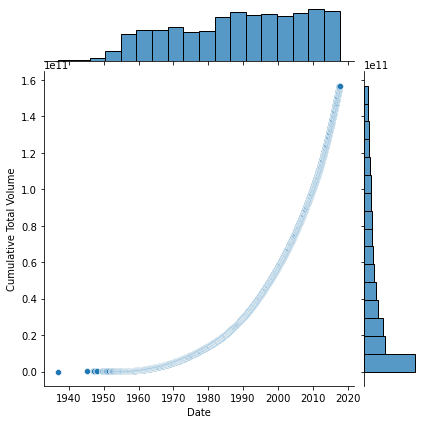

In [110]:
axs = sns.jointplot('Date', 'Cumulative Total Volume', data=wells_resamp)

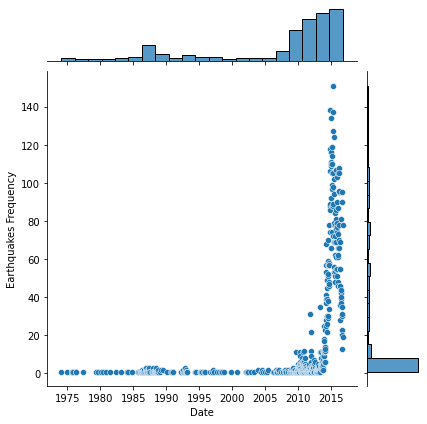

In [129]:
axs = sns.jointplot('Date', 'Earthquakes Frequency', data=earthquakes_resamp)

plt.show()

In [120]:
merge_resamp = pd.concat([wells_resamp,earthquakes_resamp])
merge_resamp = merge_resamp.sort_index()
merge_resamp['Earthquakes Frequency'] = merge_resamp['Earthquakes Frequency'].fillna(0) 
merge_resamp['Wells Frequency'] = merge_resamp['Wells Frequency'].fillna(0)
merge_resamp = merge_resamp.drop(['Days Since Last Well'], axis=1)

In [171]:
merge_resamp.tail(175)

,PSI,Daily Volume,Wells Frequency,Cumulative Daily Volume,Cumulative Total Volume,Type,Depth,Magnitude,Velocity,Earthquakes Frequency
Date,,,,,,,,,,
2015-06-07,1200.000000,950.0,1.0,2.280043e+07,1.370093e+11,Injection Well,0.000000,0.000000,0.000000,0.0
2015-06-14,0.000000,0.0,0.0,0.000000e+00,0.000000e+00,Earthquake,5.886340,2.666170,0.420106,94.0
2015-06-14,426.388889,11200.0,6.0,2.280695e+07,1.372146e+11,Injection Well,0.000000,0.000000,0.000000,0.0
2015-06-21,0.000000,0.0,0.0,0.000000e+00,0.000000e+00,Earthquake,5.196564,2.772692,0.461154,78.0
2015-06-21,1133.583333,63000.0,6.0,2.282383e+07,1.373457e+11,Injection Well,0.000000,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...
2017-07-30,1198.333333,60890.0,5.0,2.576666e+07,1.559132e+11,Injection Well,0.000000,0.000000,0.000000,0.0
2017-08-06,1047.000000,23200.0,5.0,2.580522e+07,1.560723e+11,Injection Well,0.000000,0.000000,0.000000,0.0
2017-08-13,1205.000000,2850.0,2.0,2.582519e+07,1.563047e+11,Injection Well,0.000000,0.000000,0.000000,0.0


In [263]:
merge_onehot = pd.get_dummies(merge_resamp, columns = ['Type'])

In [264]:
merge_onehot.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2962 entries, 1936-12-20 to 2017-09-03
Data columns (total 11 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   PSI                      2962 non-null   float64
 1   Daily Volume             2962 non-null   float64
 2   Wells Frequency          2962 non-null   float64
 3   Cumulative Daily Volume  2962 non-null   float64
 4   Cumulative Total Volume  2962 non-null   float64
 5   Depth                    2962 non-null   float64
 6   Magnitude                2962 non-null   float64
 7   Velocity                 2962 non-null   float64
 8   Earthquakes Frequency    2962 non-null   float64
 9   Type_Earthquake          2962 non-null   uint8  
 10  Type_Injection Well      2962 non-null   uint8  
dtypes: float64(9), uint8(2)
memory usage: 237.2 KB


In [195]:
merge_onehot = merge_onehot.drop(['PSI', 'Depth', 'Magnitude', 'Velocity'], axis=1)

In [124]:
import keras_tuner as kt
from tensorflow import keras

from keras_tuner import RandomSearch
from tensorflow import keras
from tensorflow.keras import layers, losses, metrics, optimizers
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.model_selection import TimeSeriesSplit
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, StandardScaler
from keras.models import Sequential
from keras.layers import Dense
from keras_tuner.tuners import Hyperband

In [393]:
#X_train.shape

In [ ]:
#tss = TimeSeriesSplit(n_splits = 5)
#X = merge_onehot.drop(['Earthquakes Frequency'], axis=1)
#y = merge_onehot['Earthquakes Frequency']
#for train_index, test_index in tss.split(X):
#    X_train, X_test = X.iloc[train_index, :], X.iloc[test_index,:]
#    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

In [394]:
#y_test.shape

In [299]:
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer

#Scaling Here:

In [375]:
train = merge_onehot.loc[X.index < '2015-06-01' ]
test = merge_onehot.loc[X.index >= '2015-06-01' ]

X_train = train.drop(['Earthquakes Frequency'], axis=1)
y_train = train[['Earthquakes Frequency']]
X_test = test.drop(['Earthquakes Frequency'], axis=1)
y_test = test[['Earthquakes Frequency']]

index1 = train.index
index2 = test.index
columns1 = X_test.columns
columns2 = y_test.columns

scale1 = StandardScaler()
scale2 = StandardScaler()

X_train = scale1.fit_transform(X_train)
y_train = scale2.fit_transform(y_train)
X_test = scale1.transform(X_test)
y_test = scale2.transform(y_test)


X_train = pd.DataFrame(X_train, index = index1, columns = columns1)
y_train = pd.DataFrame(y_train, index = index1, columns = columns2)
X_test = pd.DataFrame(X_test, index = index2, columns = columns1)
y_test = pd.DataFrame(y_test, index = index2, columns = columns2)

Modified from: https://stackoverflow.com/questions/38420847/apply-standardscaler-to-parts-of-a-data-set

In [392]:
#y_train.tail(50)

In [265]:
#X = merge_onehot.drop(['Earthquakes Frequency'], axis=1)
#y = merge_onehot['Earthquakes Frequency']
#X_train = X.loc[X.index < '2015-06-01' ]
#X_test = X.loc[X.index >= '2015-06-01' ]
#y_train = y.loc[y.index < '2015-06-01' ]
#y_test = y.loc[y.index >= '2015-06-01' ]

In [314]:
model1 = Sequential()
model1.add(Dense(352,activation='relu',input_shape=(10,)))
model1.add(Dense(432,activation='relu'))
model1.add(Dense(1))
model1.compile(optimizer='adam', loss='mse')

In [315]:
predictions = model1.fit(X_train,y_train, epochs=11)

Epoch 1/11
88/88 [==============================] - 0s 3ms/step - loss: 0.8534
Epoch 2/11
88/88 [==============================] - 0s 3ms/step - loss: 0.7839
Epoch 3/11
88/88 [==============================] - 0s 3ms/step - loss: 0.7672
Epoch 4/11
88/88 [==============================] - 0s 4ms/step - loss: 0.7346
Epoch 5/11
88/88 [==============================] - 0s 4ms/step - loss: 0.7526
Epoch 6/11
88/88 [==============================] - 0s 3ms/step - loss: 0.7474
Epoch 7/11
88/88 [==============================] - 0s 3ms/step - loss: 0.7153
Epoch 8/11
88/88 [==============================] - 0s 3ms/step - loss: 0.7269
Epoch 9/11
88/88 [==============================] - 0s 3ms/step - loss: 0.7072
Epoch 10/11
88/88 [==============================] - 0s 3ms/step - loss: 0.6711
Epoch 11/11
88/88 [==============================] - 0s 3ms/step - loss: 0.6630


In [317]:
# Evaluate the best model.
loss = model1.evaluate(X_test, y_test)

6/6 [==============================] - 0s 2ms/step - loss: 11.2187


In [211]:
y_pred = model1.predict(X_test)

In [212]:
print(y_pred)

[[nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]

In [322]:
def build_model(hp):
    model = Sequential()
    model.add(Dense(
        units=hp.Int(
        'units1',
        min_value=256,
        max_value=1024,
        step=16,
        default=512
        ),
        activation=hp.Choice(
        'dense_activation1',
        values=['relu', 'tanh', 'sigmoid'],
        default='relu'
        ),
        input_shape=(10,)
        ))
    model.add(Dense(
        units=hp.Int(
        'units2',
        min_value=256,
        max_value=1024,
        step=16,
        default=512
        ),
        activation=hp.Choice(
        'dense_activation2',
        values=['relu', 'tanh', 'sigmoid'],
        default='relu'
        )
        ))
    model.add(Dense(1))
    model.compile(
            optimizer=keras.optimizers.Adam(
                hp.Float(
                    'learning_rate',
                    min_value=1e-4,
                    max_value=1e-2,
                    sampling='LOG',
                    default=1e-3
                )
            ),
            loss='mse', 
            metrics = ['val_accuracy']
        )
    return model

In [323]:
tuner = Hyperband(
    build_model,
    max_epochs=20,
    objective='val_accuracy',
    seed=1,
    executions_per_trial=5,
    directory=os.path.normpath('C:/'),
    overwrite = True,
    project_name='earthquakes'
)

In [324]:
start = time.time()
tuner.search(X_train, y_train, epochs=40, validation_split=0.3)
print('It takes %s minutes' % ((time.time() - start)/60))


Search: Running Trial #1

Hyperparameter    |Value             |Best Value So Far 
units1            |352               |?                 
dense_activation1 |relu              |?                 
units2            |432               |?                 
dense_activation2 |relu              |?                 
learning_rate     |0.0017612         |?                 
tuner/epochs      |3                 |?                 
tuner/initial_e...|0                 |?                 
tuner/bracket     |2                 |?                 
tuner/round       |0                 |?                 

Epoch 1/3


ValueError: in user code:

    C:\Users\jdgil\anaconda3\lib\site-packages\tensorflow\python\keras\engine\training.py:806 train_function  *
        return step_function(self, iterator)
    C:\Users\jdgil\anaconda3\lib\site-packages\tensorflow\python\keras\engine\training.py:796 step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    C:\Users\jdgil\anaconda3\lib\site-packages\tensorflow\python\distribute\distribute_lib.py:1211 run
        return self._extended.call_for_each_replica(fn, args=args, kwargs=kwargs)
    C:\Users\jdgil\anaconda3\lib\site-packages\tensorflow\python\distribute\distribute_lib.py:2585 call_for_each_replica
        return self._call_for_each_replica(fn, args, kwargs)
    C:\Users\jdgil\anaconda3\lib\site-packages\tensorflow\python\distribute\distribute_lib.py:2945 _call_for_each_replica
        return fn(*args, **kwargs)
    C:\Users\jdgil\anaconda3\lib\site-packages\tensorflow\python\keras\engine\training.py:789 run_step  **
        outputs = model.train_step(data)
    C:\Users\jdgil\anaconda3\lib\site-packages\tensorflow\python\keras\engine\training.py:759 train_step
        self.compiled_metrics.update_state(y, y_pred, sample_weight)
    C:\Users\jdgil\anaconda3\lib\site-packages\tensorflow\python\keras\engine\compile_utils.py:388 update_state
        self.build(y_pred, y_true)
    C:\Users\jdgil\anaconda3\lib\site-packages\tensorflow\python\keras\engine\compile_utils.py:318 build
        self._metrics = nest.map_structure_up_to(y_pred, self._get_metric_objects,
    C:\Users\jdgil\anaconda3\lib\site-packages\tensorflow\python\util\nest.py:1135 map_structure_up_to
        return map_structure_with_tuple_paths_up_to(
    C:\Users\jdgil\anaconda3\lib\site-packages\tensorflow\python\util\nest.py:1234 map_structure_with_tuple_paths_up_to
        results = [func(*args, **kwargs) for args in zip(flat_path_list,
    C:\Users\jdgil\anaconda3\lib\site-packages\tensorflow\python\util\nest.py:1234 <listcomp>
        results = [func(*args, **kwargs) for args in zip(flat_path_list,
    C:\Users\jdgil\anaconda3\lib\site-packages\tensorflow\python\util\nest.py:1137 <lambda>
        lambda _, *values: func(*values),  # Discards the path arg.
    C:\Users\jdgil\anaconda3\lib\site-packages\tensorflow\python\keras\engine\compile_utils.py:419 _get_metric_objects
        return [self._get_metric_object(m, y_t, y_p) for m in metrics]
    C:\Users\jdgil\anaconda3\lib\site-packages\tensorflow\python\keras\engine\compile_utils.py:419 <listcomp>
        return [self._get_metric_object(m, y_t, y_p) for m in metrics]
    C:\Users\jdgil\anaconda3\lib\site-packages\tensorflow\python\keras\engine\compile_utils.py:438 _get_metric_object
        metric_obj = metrics_mod.get(metric)
    C:\Users\jdgil\anaconda3\lib\site-packages\tensorflow\python\keras\metrics.py:3483 get
        return deserialize(str(identifier))
    C:\Users\jdgil\anaconda3\lib\site-packages\tensorflow\python\keras\metrics.py:3439 deserialize
        return deserialize_keras_object(
    C:\Users\jdgil\anaconda3\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:377 deserialize_keras_object
        raise ValueError(

    ValueError: Unknown metric function: val_accuracy


In [311]:
# Show a summary of the search
#tuner.results_summary()

# Retrieve the best model.
best_model = tuner.get_best_models(num_models=1)[0]

# Evaluate the best model.
loss, accuracy = best_model.evaluate(X_test, y_test)

best_hyperparameters = tuner.get_best_hyperparameters(1)[0]

6/6 [==============================] - 0s 1ms/step - loss: 11.7062 - accuracy: 0.0000e+00


https://www.sicara.ai/blog/hyperparameter-tuning-keras-tuner

In [148]:
print(best_hyperparameters)

In [249]:
y_pred = best_model.predict(X_train)

In [252]:
y_pred.shape

(3851, 1)

#Making Predictions Here:

In [376]:
model_tuned = Sequential()
model_tuned.add(Dense(864,activation='tanh',input_shape=(10,)))
model_tuned.add(Dense(432,activation='tanh'))
model_tuned.add(Dense(1))
model_tuned.compile(optimizer='adam', loss='mse')

In [377]:
model_tuned.fit(X_train,y_train, epochs=15)

Epoch 1/15
88/88 [==============================] - 1s 9ms/step - loss: 1.0367
Epoch 2/15
88/88 [==============================] - 1s 6ms/step - loss: 0.8696
Epoch 3/15
88/88 [==============================] - 1s 7ms/step - loss: 0.8522
Epoch 4/15
88/88 [==============================] - 1s 7ms/step - loss: 0.8226
Epoch 5/15
88/88 [==============================] - 1s 6ms/step - loss: 0.8295
Epoch 6/15
88/88 [==============================] - 1s 7ms/step - loss: 0.8039
Epoch 7/15
88/88 [==============================] - 1s 6ms/step - loss: 0.8218
Epoch 8/15
88/88 [==============================] - 1s 7ms/step - loss: 0.8043
Epoch 9/15
88/88 [==============================] - 1s 7ms/step - loss: 0.8007
Epoch 10/15
88/88 [==============================] - 1s 7ms/step - loss: 0.7749
Epoch 11/15
88/88 [==============================] - 1s 7ms/step - loss: 0.7745
Epoch 12/15
88/88 [==============================] - 1s 9ms/step - loss: 0.7818
Epoch 13/15
88/88 [==============================

In [269]:
#accuracy = model_tuned.evaluate(X_test, y_test)

6/6 [==============================] - 0s 2ms/step - loss: 1150.6190 - accuracy: 0.6080


In [389]:
y_pred = model_tuned.predict(X_test)

In [395]:
print(y_pred,y_test)

[[ 1.8455689 ]
 [-0.05242087]
 [ 2.0529246 ]
 [-0.0534239 ]
 [ 1.0527037 ]
 [-0.18284604]
 [ 1.4606802 ]
 [-0.09286342]
 [ 1.5686527 ]
 [-0.03083366]
 [-0.06969184]
 [ 1.4767404 ]
 [ 1.4861376 ]
 [-0.12324671]
 [ 0.56230175]
 [-0.15661162]
 [ 0.26773235]
 [-0.08169691]
 [ 0.7875652 ]
 [ 0.83832383]
 [-0.04775895]
 [-0.04722252]
 [ 1.3660716 ]
 [ 0.96251446]
 [-0.06104422]
 [ 1.3363326 ]
 [-0.10838593]
 [ 2.169828  ]
 [-0.1956087 ]
 [ 0.97048426]
 [-0.12904426]
 [ 1.2219356 ]
 [-0.05213229]
 [ 1.7921461 ]
 [ 1.1366781 ]
 [-0.09038565]
 [ 1.804184  ]
 [-0.0950646 ]
 [ 1.6287383 ]
 [-0.07707807]
 [-0.03591645]
 [ 0.6224886 ]
 [ 0.9386921 ]
 [-0.06314336]
 [ 0.26142767]
 [ 1.3789747 ]
 [-0.05994785]
 [-0.05684779]
 [ 1.806029  ]
 [-0.17409733]
 [ 1.2781979 ]
 [ 1.7440587 ]
 [-0.04892424]
 [-0.24316773]
 [ 1.3173021 ]
 [ 1.4567395 ]
 [ 1.8484313 ]
 [-0.07513496]
 [ 1.8916025 ]
 [-0.06218037]
 [-0.09310713]
 [ 1.8629198 ]
 [ 1.8618376 ]
 [-0.22211474]
 [-0.05326055]
 [ 1.5079308 ]
 [-0.04605

In [383]:
y_pred_df = pd.DataFrame(y_pred, index=index2, columns = columns2)
y_test = pd.DataFrame(y_test, index=index2, columns = columns2)

In [390]:
y_pred_df = scale2.inverse_transform(y_pred_df)
y_test = scale2.inverse_transform(y_test)
y_pred_df = pd.DataFrame(y_pred, index=index2, columns = columns2)
y_test = pd.DataFrame(y_test, index=index2, columns = columns2)

In [391]:
y_pred_df.head()

,Earthquakes Frequency
Date,
2015-06-07,1.845569
2015-06-07,-0.052421
2015-06-14,2.052925
2015-06-14,-0.053424
2015-06-21,1.052704


In [397]:
y_pred_df.value_counts().count()

176

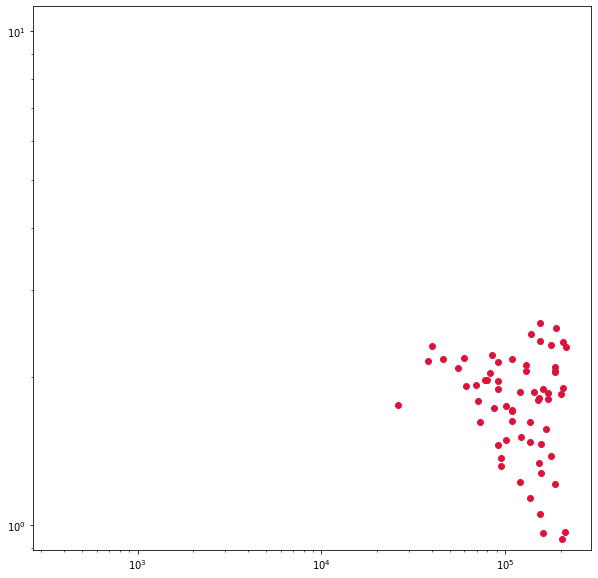

In [396]:
plt.figure(figsize=(10,10))
plt.scatter(y_test, y_pred, c='crimson')
plt.yscale('log')
plt.xscale('log')

#p1 = max(max(y_pred), max(y_test))
#p2 = min(min(y_pred), min(y_test))
#plt.plot([p1, p2], [p1, p2], 'b-')
#plt.xlabel('True Values', fontsize=15)
#plt.ylabel('Predictions', fontsize=15)
#plt.axis('equal')
#plt.show()